In [2]:
pip install xgboost

   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 320.0 kB/s eta 0:06:31
   ---------------------------------------- 0.1/124.9 MB 648.1 kB/s eta 0:03:13
   ---------------------------------------- 0.4/124.9 MB 2.9 MB/s eta 0:00:43
   ---------------------------------------- 1.3/124.9 MB 7.0 MB/s eta 0:00:18
    --------------------------------------- 2.3/124.9 MB 9.8 MB/s eta 0:00:13
   - -------------------------------------- 3.5/124.9 MB 12.4 MB/s eta 0:00:10
   - -------------------------------------- 4.4/124.9 MB 13.4 MB/s eta 0:00:09
   - -------------------------------------- 5.5/124.9 MB 14.6 MB/s eta 0:00:09
   -- ------------------------------------- 6.5/124.9 MB 15.5 MB/s eta 0:00:08
   -- ------------------------------------- 7.6/124.9 MB 16.2 MB/s eta 0:00:08
   -- ------------------------------------- 8.7/124.9 MB 16.8 MB/s eta 0:00:07
   --- ------------------------------------ 9.6/124.9 MB 17.1


[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [51]:
# libraries
import pandas as pd
import numpy as np
import warnings

# Visualizations
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import plotly.express as px

# Machine Learning
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score, KFold
from xgboost import XGBRegressor

In [5]:
import pandas as pd

file_path = 'D:/NASA TOPS/meteorites.csv'
df = pd.read_csv(file_path)

df.head(100)

,name,id,name_type,class,mass,fall,year,lat,long,geolocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)"
...,...,...,...,...,...,...,...,...,...,...
95,Benguerir,30443,Valid,LL6,25000.0,Fell,2004.0,32.25000,-8.15000,"(32.25, -8.15)"
96,Beni M'hira,5018,Valid,L6,19000.0,Fell,2001.0,32.86667,10.80000,"(32.86667, 10.8)"
97,Benld,5021,Valid,H6,1770.5,Fell,1938.0,39.08333,-89.15000,"(39.08333, -89.15)"
98,Benoni,5023,Valid,H6,3880.0,Fell,1943.0,-26.16667,28.41667,"(-26.16667, 28.41667)"


In [6]:
def duplicates(df):
    before = df.shape[0]
    df = df.drop_duplicates()
    after = df.shape[0]

    total_duplicates = before - after
    print(f"There are a total of {total_duplicates} duplicates in this dataset.")
    
duplicates(df)

There are a total of 0 duplicates in this dataset.


In [7]:
# Data types are looking solid
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45716 non-null  object 
 1   id           45716 non-null  int64  
 2   name_type    45716 non-null  object 
 3   class        45716 non-null  object 
 4   mass         45585 non-null  float64
 5   fall         45716 non-null  object 
 6   year         45425 non-null  float64
 7   lat          38401 non-null  float64
 8   long         38401 non-null  float64
 9   geolocation  38401 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.5+ MB


Total Valid Count:  45641 
Total Relict Count:  75


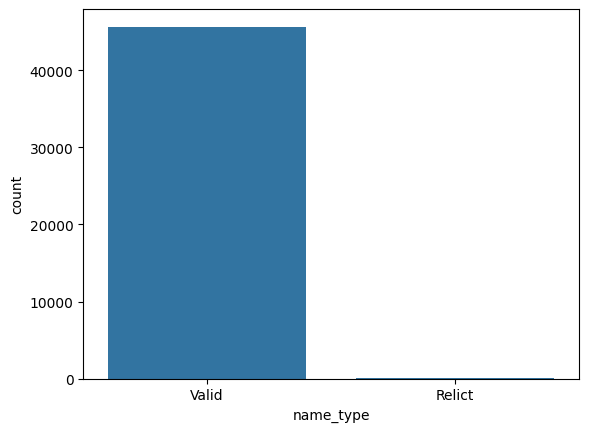

,name,id,name_type,class,mass,fall,year,lat,long,geolocation
5219,Brunflo,5157,Relict,Relict H,NaN,Found,1980.0,63.11667,14.28333,"(63.11667, 14.28333)"
6818,David Glacier 92308,6614,Relict,Chondrite-fusion crust,1.7,Found,1992.0,-75.31667,162.00000,"(-75.31667, 162.0)"
12640,Gove,52859,Relict,Relict iron,0.0,Found,1979.0,-12.26333,136.83833,"(-12.26333, 136.83833)"
15947,Gullhögen 001,44889,Relict,Relict OC,NaN,Found,2000.0,58.38333,13.80000,"(58.38333, 13.8)"
17756,LaPaz Icefield 031037,35780,Relict,Fusion crust,0.1,Found,2003.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
31073,Österplana 060,56159,Relict,Relict OC,0.0,Found,2009.0,58.58333,13.43333,"(58.58333, 13.43333)"
31074,Österplana 061,56160,Relict,Relict OC,0.0,Found,2009.0,58.58333,13.43333,"(58.58333, 13.43333)"
31075,Österplana 062,56161,Relict,Relict OC,0.0,Found,2010.0,58.58333,13.43333,"(58.58333, 13.43333)"
31076,Österplana 063,56162,Relict,Relict OC,0.0,Found,2010.0,58.58333,13.43333,"(58.58333, 13.43333)"


<Figure size 640x480 with 0 Axes>

In [10]:
# A relict meteorite is an old meteorite that has undergone significant chemical changes since it has landed on Earth
print('Total Valid Count: ',df.name_type.value_counts()['Valid'], 
      '\nTotal Relict Count: ', df.name_type.value_counts()['Relict'])

sns.countplot(x='name_type',data=df)
plt.show()
plt.clf()

# Group the name types into only relicts
grouped_type = df.groupby('name_type')
relict = grouped_type.get_group('Relict')
relict

In [11]:
# Not surprisingling, all relicts are classified as found
relict_found = [relict.name_type.count(), relict.fall.count()]
print(f"There are {relict_found[0]} relicts in this dataset, and {(relict_found[1]/relict_found[0])*100}% of them are classified as Found.")

There are 75 relicts in this dataset, and 100.0% of them are classified as Found.


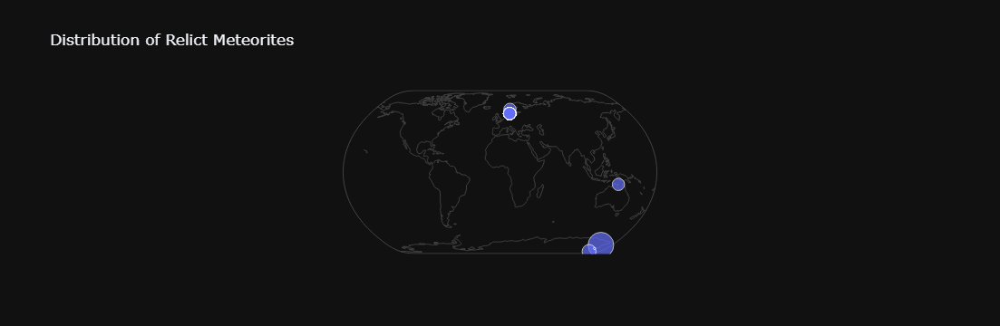

In [12]:
warnings.filterwarnings("ignore") 

relict.mass = relict.mass.replace([' ', 0.0], np.NaN)
relict.mass = relict.mass.fillna(relict.mass.mean()) 

relict_figure = px.scatter_geo(
    relict,
    lat='lat',
    lon='long',
    title='Distribution of Relict Meteorites',
    projection='natural earth', 
    hover_name='name', 
    size='mass', 
    template='plotly_dark',
)

relict_figure.show()
warnings.resetwarnings()

In [13]:
# Not surprisingling, all relicts are classified as found
relict_found = [relict.name_type.count(), relict.fall.count()]
print(f"There are {relict_found[0]} relicts in this dataset, and {(relict_found[1]/relict_found[0])*100}% of them are classified as Found.")

There are 75 relicts in this dataset, and 100.0% of them are classified as Found.


C:\Users\sathv\AppData\Local\Temp\ipykernel_27256\2216906537.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





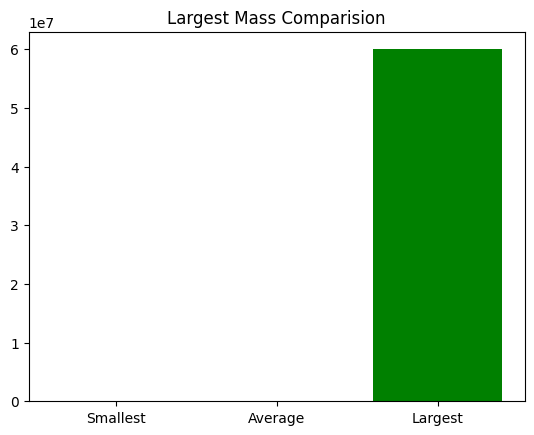

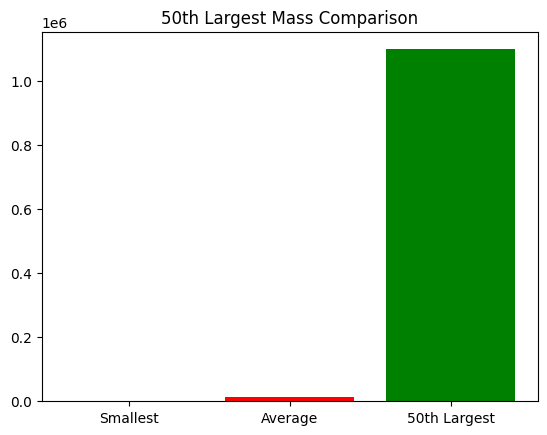

In [14]:
sorted_mass = df.sort_values(by='mass', ascending=False)
sorted_mass.mass.replace(0.0, np.NaN, inplace=True)
sorted_mass.mass = sorted_mass.mass.dropna()

top_50_mass = sorted_mass['mass'].head(50).tolist()
mass_50th_largest = top_50_mass[-1]

average_mass = df.mass.mean()
smallest_mass = sorted_mass['mass'].min() # smallest
largest_mass = sorted_mass['mass'].max() # largest

# Clearly there are some very large masses, let's look at the 50th largest to get a better idea
mass_values = [smallest_mass,average_mass,largest_mass]
new_mass_values = [smallest_mass,average_mass,mass_50th_largest]
mass_names = ['Smallest', 'Average', 'Largest']
new_mass_names = ['Smallest', 'Average', '50th Largest']

plt.bar(mass_names, mass_values, color=['blue', 'red', 'green'])
plt.title("Largest Mass Comparision")
plt.show()
plt.clf()

plt.bar(new_mass_names, new_mass_values, color=['blue', 'red', 'green'])
plt.title("50th Largest Mass Comparison")
plt.show()

Total Fell Count:  1107 
Total Found Count:  44609


<Axes: xlabel='fall', ylabel='count'>

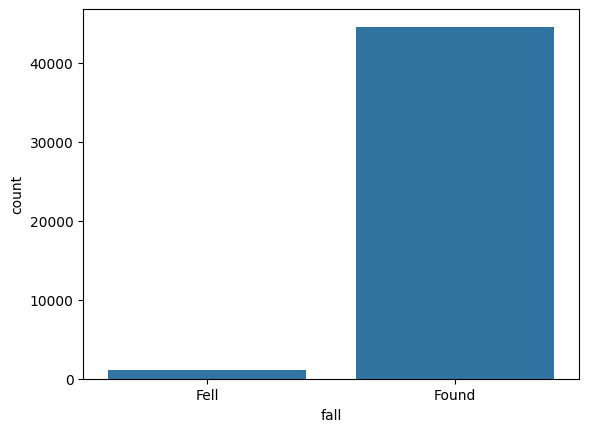

In [16]:
print('Total Fell Count: ',df.fall.value_counts()['Fell'], 
      '\nTotal Found Count: ', df.fall.value_counts()['Found'])

sns.countplot(x='fall',data=df)

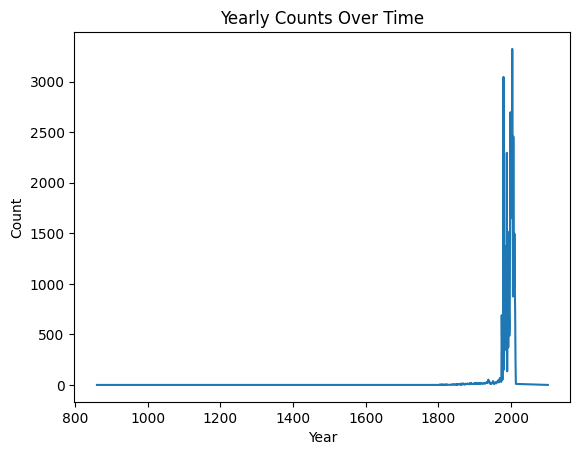

In [17]:
yearly_rates = df.year.value_counts() # count the amount of values for each year
yearly_rates = yearly_rates.sort_index()

plt.plot(yearly_rates.index, yearly_rates.values)
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Yearly Counts Over Time')
plt.show()

In [18]:
print("The earliest meteorite recorded", yearly_rates.index.min())
print("The latest meteorite recorded", yearly_rates.index.max())

The earliest meteorite recorded 860.0
The latest meteorite recorded 2101.0


In [19]:
df.query("year == 860.0")


,name,id,name_type,class,mass,fall,year,lat,long,geolocation
704,Nogata,16988,Valid,L6,472.0,Fell,860.0,33.725,130.75,"(33.725, 130.75)"


In [20]:
df.at[704, 'year'] = 861.0 # redefine to the correct value
df.query("name == 'Nogata'")

,name,id,name_type,class,mass,fall,year,lat,long,geolocation
704,Nogata,16988,Valid,L6,472.0,Fell,861.0,33.725,130.75,"(33.725, 130.75)"


In [21]:
 # Sort the year column to be chronological
df_sorted_year = df.sort_values(by='year', ascending=False)

latest_5_years = df_sorted_year['year'].head(5)

# Let's check to make sure there is only 1 future value
print(latest_5_years)

30682    2101.0
194      2013.0
30730    2013.0
30763    2013.0
30774    2013.0
Name: year, dtype: float64


In [22]:
# Let's take a look at this meteorite and find out its actual discovery date, the geolocation is unknown too and will be
# addressed later 
df.query("year == 2101.0")

,name,id,name_type,class,mass,fall,year,lat,long,geolocation
30682,Northwest Africa 7701,57150,Valid,CK6,55.0,Found,2101.0,0.0,0.0,"(0.0, 0.0)"


In [23]:
# Northwest Africa 7701 was discovered in 2010, so just slight input error
df.at[30682, 'year'] = 2010.0 # redefine to the correct value
df.query("name == 'Northwest Africa 7701'")

,name,id,name_type,class,mass,fall,year,lat,long,geolocation
30682,Northwest Africa 7701,57150,Valid,CK6,55.0,Found,2010.0,0.0,0.0,"(0.0, 0.0)"


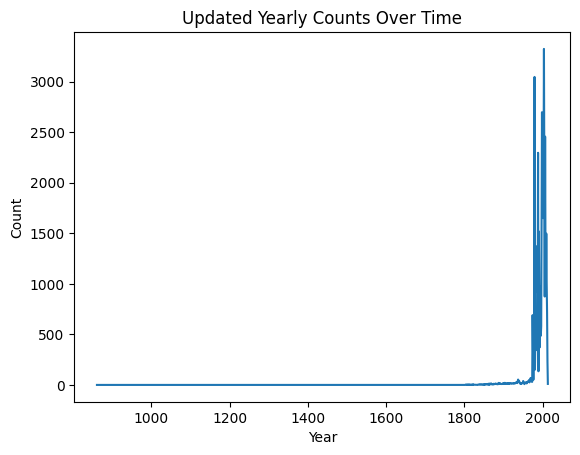

In [24]:
yearly_rates = df.year.value_counts() 
yearly_rates = yearly_rates.sort_index()

plt.plot(yearly_rates.index, yearly_rates.values)
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Updated Yearly Counts Over Time')
plt.show()

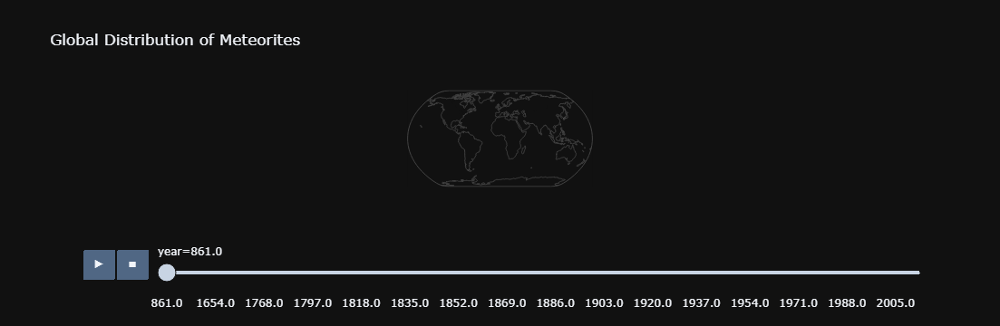

In [25]:
animation_df = df 
animation_df.mass = animation_df.mass.replace([' ', 0.0], np.NaN)
animation_df.mass = animation_df.mass.fillna(animation_df.mass.mean()) 
animation_df = animation_df.sort_values(['year'])

fig = px.scatter_geo(
    animation_df,
    lat='lat',
    lon='long',
    title='Global Distribution of Meteorites',
    projection='natural earth', 
    hover_name='name', 
    size='mass', 
    template='plotly_dark',
    animation_frame='year'
)

fig.show()

In [26]:
df.isnull().sum()


name              0
id                0
name_type         0
class             0
mass              0
fall              0
year            291
lat            7315
long           7315
geolocation    7315
dtype: int64

<Axes: >

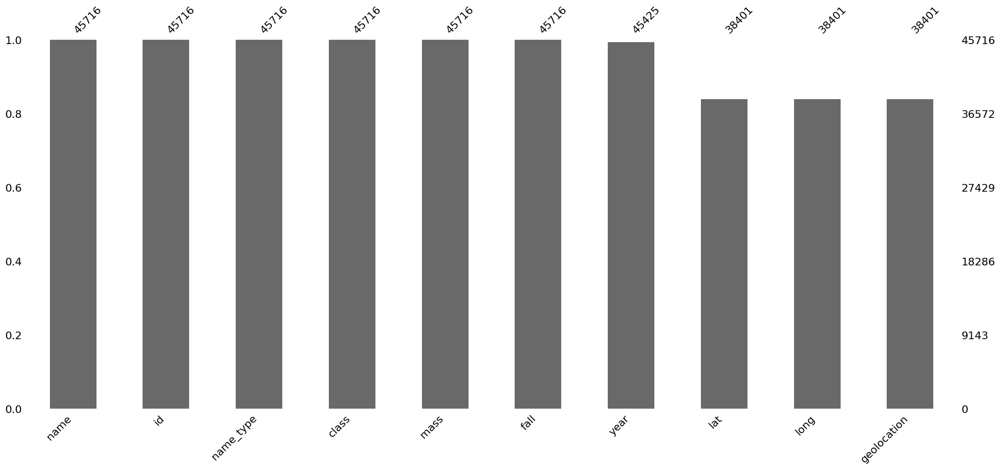

In [27]:
# Display a bar graph of total values in each column, 
msno.bar(df)

In [28]:
# Fill all missing values and update the current dataframe
df['mass'].fillna(df['mass'].mean(), inplace=True) # fill with the average mass
df['year'].fillna(df['year'].mode()[0], inplace=True) # fill with the most common value
df['lat'].fillna(df['lat'].mode()[0], inplace=True) # fill with the most common value
df['long'].fillna(df['long'].mode()[0], inplace=True) # fill with the most common value
df['geolocation'].fillna(df['geolocation'].mode()[0], inplace=True) # fill with the most common value

In [30]:
df.isnull().sum()


name           0
id             0
name_type      0
class          0
mass           0
fall           0
year           0
lat            0
long           0
geolocation    0
dtype: int64

In [32]:
#Normalising

In [35]:
# Z-Score Normalization
mass_column = df[['mass']]
standard_scaler = StandardScaler()
df['mass_zscore'] = standard_scaler.fit_transform(mass_column)

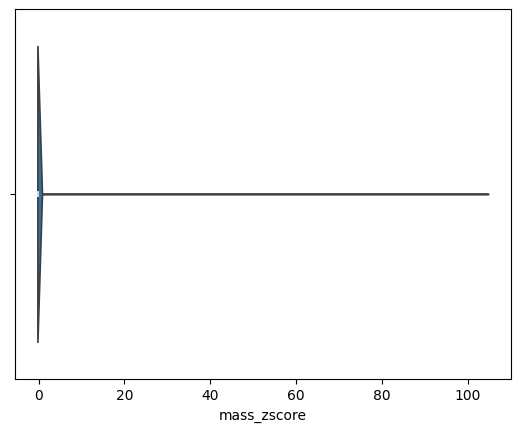

In [36]:
sns.violinplot(data=df, x='mass_zscore')
plt.show()

In [39]:
# Apply a natural logarithm to the mass column before applying a Z-Score noramlization
df['mass_log'] = np.log1p(df['mass'])

# Apply Z-score normalization to the log-transformed values
standard_scaler = StandardScaler()
df['mass_log_scaled'] = standard_scaler.fit_transform(df[['mass_log']])

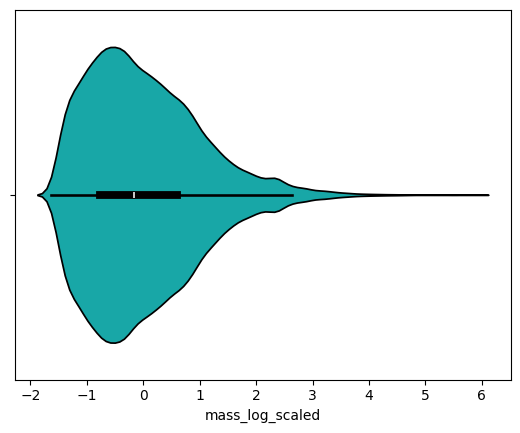

In [40]:
# Now let's reevaluate the violin plot to see the distribution again 
sns.violinplot(data=df, x='mass_log_scaled', color='c', linecolor='k')
plt.show()

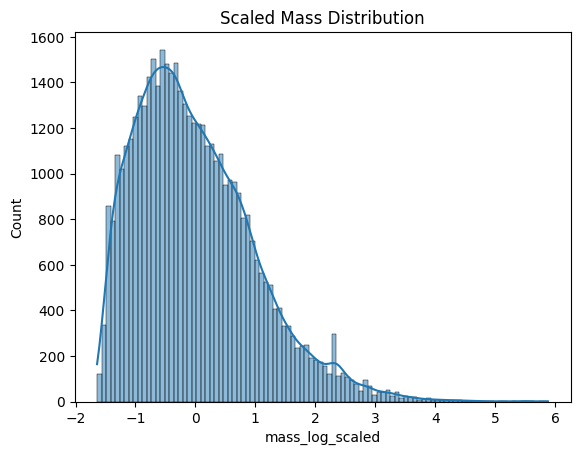

In [41]:
# Create a histogram of the normalized/log-scaled mass, it looks like the mode is slightly less the median
sns.histplot(data=df, x='mass_log_scaled', kde=True)
plt.title("Scaled Mass Distribution")
plt.show()

In [42]:
# Assign every row a 1 to represent that a meteorite was discovered  
df['discovered'] = 1
df.head()

,name,id,name_type,class,mass,fall,year,lat,long,geolocation,mass_zscore,mass_log,mass_log_scaled,discovered
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)",-0.023099,3.091042,-0.345685,1
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)",-0.021882,6.580639,1.120485,1
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)",0.163224,11.580593,3.221238,1
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)",-0.019802,7.557473,1.530906,1
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)",-0.021777,6.660575,1.154070,1


In [43]:
# Sum the total rows for each year
total_discovered_per_year = df.groupby('year')['discovered'].sum().reset_index()

# Filter data for years 1958 and above (when NASA was founded)
total_discovered_per_year = total_discovered_per_year[total_discovered_per_year['year'] >= 1958]

print(total_discovered_per_year.head(5))
print(total_discovered_per_year.tail(5))

       year  discovered
208  1958.0          18
209  1959.0          16
210  1960.0          30
211  1961.0          27
212  1962.0          36
       year  discovered
259  2009.0        1497
260  2010.0        1006
261  2011.0         713
262  2012.0         234
263  2013.0          11


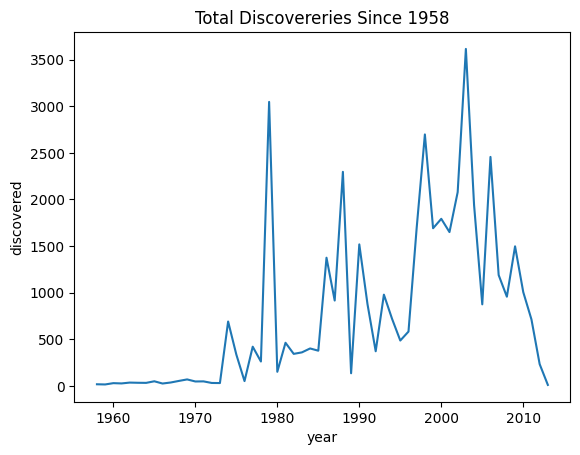

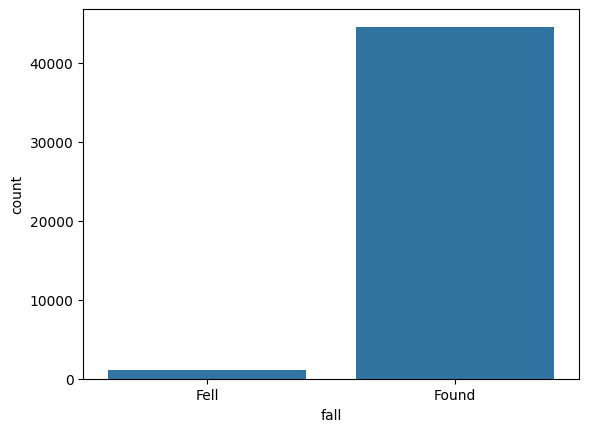

In [44]:
# Apply a natural logatrithm to the total discovery counts for each year
total_discovered_per_year['discovered_log'] = np.log1p(total_discovered_per_year['discovered'])

# Apply Z-score normalization to the log-transformed values
standard_scaler = StandardScaler()
total_discovered_per_year['discovered_log_scaled'] = standard_scaler.fit_transform(total_discovered_per_year[['discovered_log']])

sns.lineplot(data=total_discovered_per_year, x="year", y="discovered")
plt.title('Total Discovereries Since 1958')
plt.show()
plt.clf()

sns.countplot(x='fall',data=df)
plt.show()

Range of discovered values: 3603.0


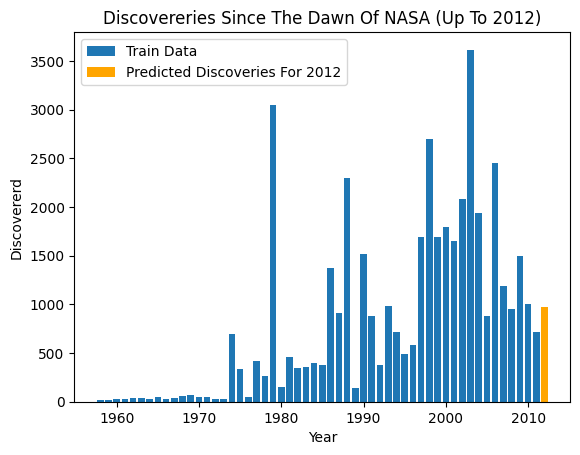

In [45]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Split the data into training (1958 to 2011) and testing (2012) sets
train_data = total_discovered_per_year[total_discovered_per_year['year'] < 2012]
test_data = total_discovered_per_year[total_discovered_per_year['year'] == 2012]

# Define the training values
X_train = train_data['year'].values.reshape(-1, 1)
y_train = train_data['discovered_log_scaled']

# Define the testing values
X_test = test_data['year'].values.reshape(-1, 1)
y_test = test_data['discovered_log_scaled']

# Define specific XGBoost parameters to prevent overfitting
params = {
    'max_depth': 5,
    'min_child_weight': 1,
    'subsample': 0.8,
    'gamma': 0.1,
}

# Create the XGBoost model
xgb_model = XGBRegressor(n_estimators=100, random_state=10, **params)
xgb_model.fit(X_train, y_train) # train the model

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

print("Range of discovered values:", total_discovered_per_year.max()[1] - total_discovered_per_year.min()[1])

# Inverse transform the predicted values to revert them back to their original scale
y_pred_original_scale = np.expm1(standard_scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten())

# Visualize the model by plotting training data and test data
plt.bar(train_data['year'], train_data['discovered'], label='Train Data')
plt.bar(test_data['year'], y_pred_original_scale, label='Predicted Discoveries For 2012', color='orange')
plt.xlabel('Year')
plt.ylabel('Discovererd')
plt.title('Discovereries Since The Dawn Of NASA (Up To 2012)')
plt.legend(loc='upper left')
plt.show()

In [46]:
# Define a kfold object to split the XGBoost model into 5 separate folds
kfold = KFold(n_splits=5, shuffle=True, random_state=10)

# Create a Cross Validation function to score the model
scores = cross_val_score(xgb_model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

# Convert the negative MSE scores to positive values by calculating the root mean square
rmse_scores = (-scores)**0.5

# Evaluate the cross-validated RMSE scores
print("Cross-validated RMSE scores:", rmse_scores)
print("Mean RMSE:", rmse_scores.mean())

Cross-validated RMSE scores: [0.61500518 0.4219958  0.64151651 0.57537247 0.32570424]
Mean RMSE: 0.515918838409043


In [47]:
# Creates a function to evaluate the performance of the model
def evaluate_model(model, X, y_true):
    y_pred = model.predict(X)
    
    # Mean Absolute Error
    mae = mean_absolute_error(y_true, y_pred)
    
    # Mean Squarred Error
    mse = mean_squared_error(y_true, y_pred)
        
    return {'Mean Absolute Error': mae,
           'Mean Squarred Error': mse}

evaluation_results = evaluate_model(xgb_model, X_test, y_test)

for metric, value in evaluation_results.items():
    print(f'{metric}: {value:.2f}')

Mean Absolute Error: 0.86
Mean Squarred Error: 0.74


In [48]:
#MAE variance accountability: 0.000225

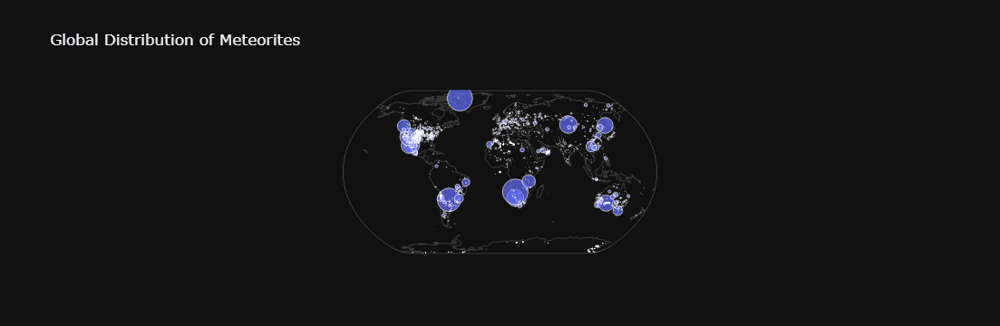

In [50]:
fig_map = px.scatter_geo(
    animation_df,
    lat='lat',
    lon='long',
    title='Global Distribution of Meteorites',
    projection='natural earth', 
    hover_name='name', 
    size='mass', 
    template='plotly_dark',
)

fig_map.show()